# Prediction of Stock Price using ARIMA and LSTM


## Contents

Part 0: Set Up Google Drive Environment

Part 1: Load Data

Part 2: Analyze Data
*   Part 2.1: Visualization and Manipulation
*   Part 2.2: OHLC Chart
*   Part 2.3: ACF and PACF Analysis

Part 3: ARMA Model
*   Part 3.1: ARMA Model for Residuals of Google High
*   Part 3.2: ARIMA Model for Microsoft Volume
*   Part 3.3: ARIMA Model for Google Volume

Part 4: LSTM
*   Part 4.1: Base Case for Google High
*   Part 4.2: Tune Neural Network Hyperparameters
*   Part 4.3: Apply Tuned Parameters

#Part 0: Set Up Google Drive Environment


In [0]:
# Import libraries
import os
import warnings
warnings.filterwarnings('ignore')
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight') 

from pylab import rcParams

import statsmodels.api as sm
from numpy.random import normal, seed
from scipy.stats import norm
from statsmodels.tsa.arima_model import ARMA
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima_process import ArmaProcess
from statsmodels.tsa.arima_model import ARIMA
import math
from sklearn.metrics import mean_squared_error

#!pip install chart_studio
import chart_studio.plotly as py
import plotly.graph_objs as go
from plotly import tools
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)
import plotly.figure_factory as ff

In [0]:
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

# Part 1: Load Data

In [0]:
# read data from Google Drive
file_id='1BTHjSlI_YbSdr1rF1-_o-cnp-DG2epzH'
link='https://drive.google.com/uc?export=download&id={FILE_ID}'
csv_url=link.format(FILE_ID=file_id)
google = pd.read_csv(csv_url, index_col='Date', parse_dates=['Date'])

google.head()
#google.tail()

,Open,High,Low,Close,Volume,Name
Date,,,,,,
2006-01-03,211.47,218.05,209.32,217.83,13137450,GOOGL
2006-01-04,222.17,224.70,220.09,222.84,15292353,GOOGL
2006-01-05,223.22,226.00,220.97,225.85,10815661,GOOGL
2006-01-06,228.66,235.49,226.85,233.06,17759521,GOOGL
2006-01-09,233.44,236.94,230.70,233.68,12795837,GOOGL


In [0]:
file_id='1nHsjGfyi3hJqWJOfLAIQmMlZmMbZAepg'
link='https://drive.google.com/uc?export=download&id={FILE_ID}'
csv_url=link.format(FILE_ID=file_id)
microsoft = pd.read_csv(csv_url, index_col='Date', parse_dates=['Date'])

#microsoft.head()
microsoft.tail()

,Open,High,Low,Close,Volume,Name
Date,,,,,,
2017-12-22,85.40,85.63,84.92,85.51,14145841,MSFT
2017-12-26,85.31,85.53,85.03,85.40,9891237,MSFT
2017-12-27,85.65,85.98,85.22,85.71,14678025,MSFT
2017-12-28,85.90,85.93,85.55,85.72,10594344,MSFT
2017-12-29,85.63,86.05,85.50,85.54,18717406,MSFT


In [0]:
#google = pd.read_csv('C:/work/DS/timeseries/data/GOOGL_2006-01-01_to_2018-01-01.csv', index_col='Date', parse_dates=['Date'])
#google.head()
#microsoft = pd.read_csv('C:/work/DS/timeseries/data/MSFT_2006-01-01_to_2018-01-01.csv', index_col='Date', parse_dates=['Date'])

# Part 2: Analyze Data

### Part 2.1: Visualization and Manipulation

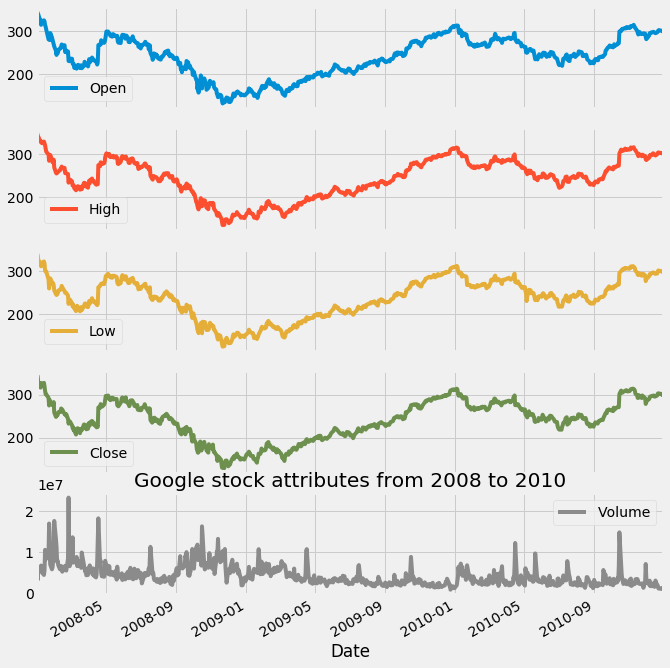

In [0]:
google['2008':'2010'].plot(subplots=True, figsize=(10,12))
plt.title('Google stock attributes from 2008 to 2010')
plt.savefig('stocks.png')

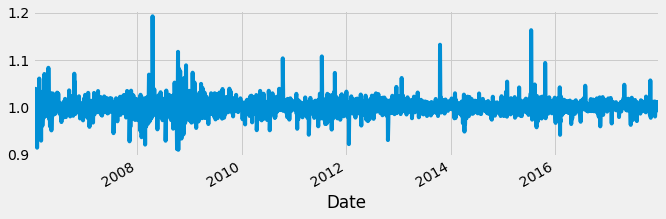

In [0]:
# shift index by desired number of periods (1) with an optional time
# then fo the calculation: true value / shifted value e.g. [1,3,12] -> [NaN, 1, 3] -> [NaN, 3, 4]
google['Change'] = google.High.div(google.High.shift())
google['Change'].plot(figsize=(10, 3))

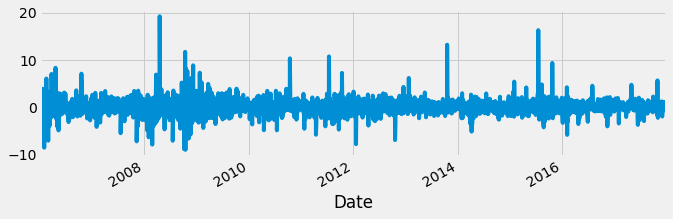

In [0]:
google['Return'] = google.Change.sub(1).mul(100) # (Change - 1) * 100
google['Return'].plot(figsize=(10,3))

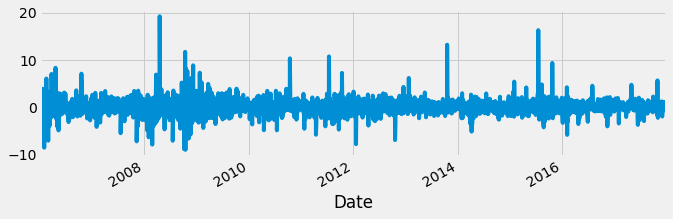

In [0]:
# pct_change(): get percentage change between the current and a prior element
google.High.pct_change().mul(100).plot(figsize=(10,3)) 
plt.show()

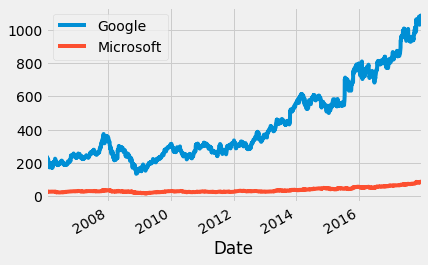

In [0]:
google.High.plot()
microsoft.High.plot()
plt.legend(['Google','Microsoft'])

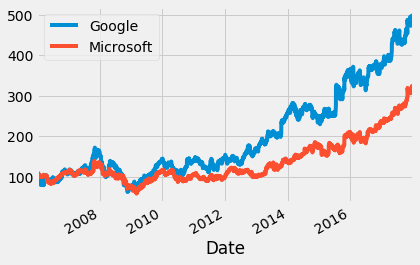

In [0]:
normalized_google = google.High.div(google.High.iloc[0]).mul(100) # iloc[0]: row 0
normalized_microsoft = microsoft.High.div(microsoft.High.iloc[0]).mul(100)
normalized_google.plot()
normalized_microsoft.plot()
plt.legend(['Google','Microsoft'])

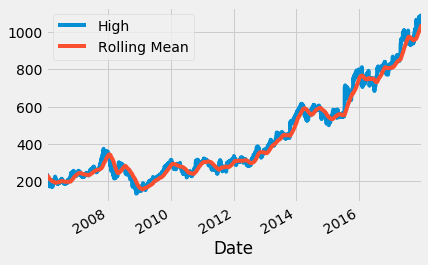

In [0]:
# plot a rolling mean of 90 day window with original High attribute of google stocks
rolling_google = google.High.rolling('90D').mean()
google.High.plot()
rolling_google.plot()

plt.legend(['High','Rolling Mean'])

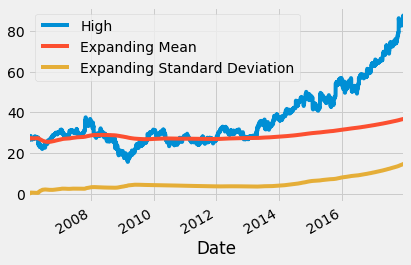

In [0]:
microsoft_mean = microsoft.High.expanding().mean() # expanding().mean(): mean of slide window with default period 1
microsoft_std = microsoft.High.expanding().std()
microsoft.High.plot()
microsoft_mean.plot()
microsoft_std.plot()
plt.legend(['High','Expanding Mean','Expanding Standard Deviation'])

### Part 2.2: OHLC Chart (Open-high-low-close chart)

In [0]:
#!pip install plotly --upgrade
def configure_plotly_browser_state():
  import IPython
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-1.5.1.min.js?noext',
            },
          });
        </script>
        '''))

In [0]:
configure_plotly_browser_state()
init_notebook_mode(connected=False)

trace = go.Ohlc(x=google['06-2008'].index,
                open=google['03-2008'].Open,
                high=google['06-2008'].High,
                low=google['06-2008'].Low,
                close=google['06-2008'].Close)
data = [trace]
iplot(data, filename='simple_ohlc')
fig = go.Figure(data)
fig.show()

In [0]:
def configure_plotly_browser_state():
  import IPython
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-1.5.1.min.js?noext',
            },
          });
        </script>
        '''))
  
configure_plotly_browser_state()
init_notebook_mode(connected=False)

trace = go.Ohlc(x=google['2008'].index,
                open=google['2008'].Open,
                high=google['2008'].High,
                low=google['2008'].Low,
                close=google['2008'].Close)
data = [trace]
iplot(data, filename='simple_ohlc')

In [0]:
def configure_plotly_browser_state():
  import IPython
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-1.5.1.min.js?noext',
            },
          });
        </script>
        '''))

configure_plotly_browser_state()
init_notebook_mode(connected=False)

trace = go.Candlestick(x=google['03-2008'].index,
                open=google['03-2008'].Open,
                high=google['03-2008'].High,
                low=google['03-2008'].Low,
                close=google['03-2008'].Close)
data = [trace]
iplot(data, filename='simple_candlestick')

In [0]:
def configure_plotly_browser_state():
  import IPython
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-1.5.1.min.js?noext',
            },
          });
        </script>
        '''))
  
configure_plotly_browser_state()
init_notebook_mode(connected=False)

trace = go.Candlestick(x=google.index,
                open=google.Open,
                high=google.High,
                low=google.Low,
                close=google.Close)
data = [trace]
iplot(data, filename='simple_candlestick')

### Part 2.3: ACF and PACF Analysis

#### Low

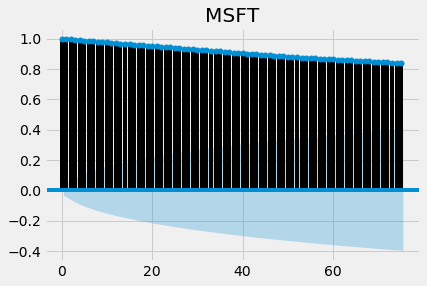

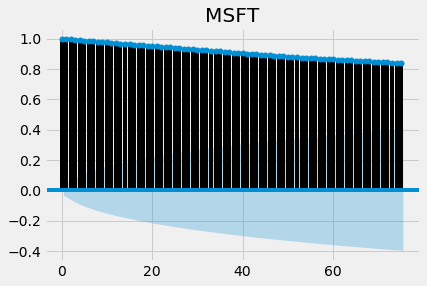

In [0]:
plot_acf(microsoft["Low"],lags=75,title="MSFT") # ACF lags -> self correlated 

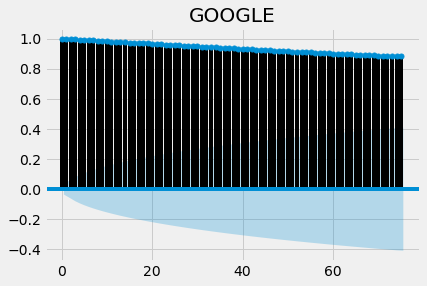

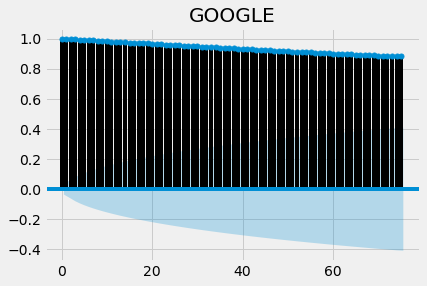

In [0]:
plot_acf(google["Low"],lags=75,title="GOOGLE")

#### Close

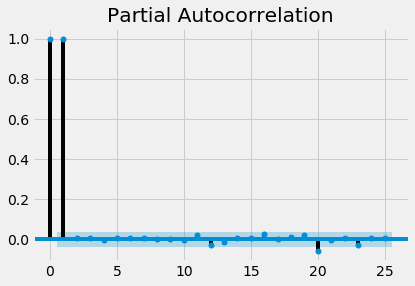

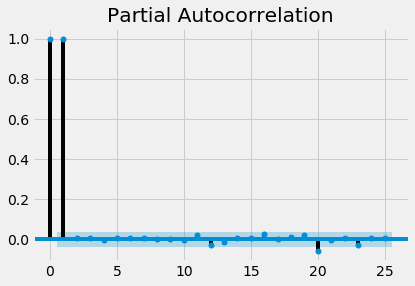

In [0]:
plot_pacf(microsoft["Close"],lags=25) # PACF displays a sharp cutoff, we should choose AR model.

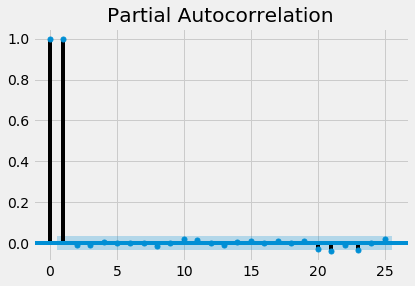

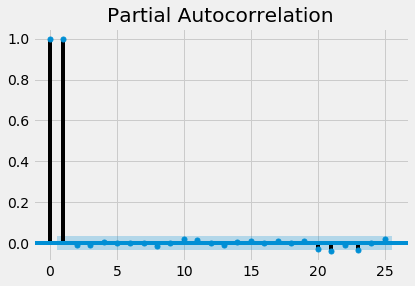

In [0]:
plot_pacf(google["Close"],lags=25)

#### High

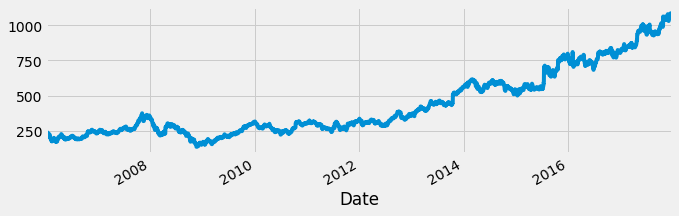

In [0]:
google["High"].plot(figsize=(10,3))

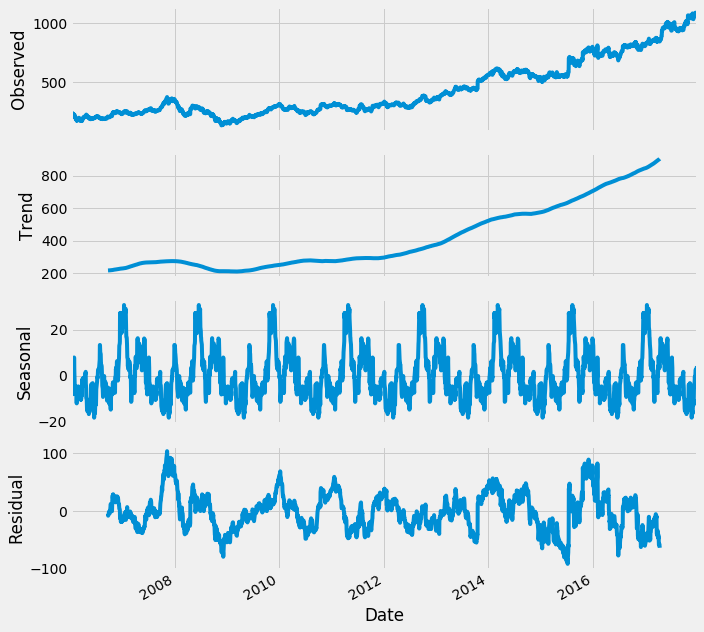

In [0]:
# seasonal decomposition using moving averages
rcParams['figure.figsize'] = 10, 9
decomposed_google_volume = sm.tsa.seasonal_decompose(google["High"],model='additive',freq=360) # The frequncy is annual
figure = decomposed_google_volume.plot()
plt.show()
# Additive model: [t] = T[t] + S[t] + e[t]
# multiplicative model is Y[t] = T[t] * S[t] * e[t]Y

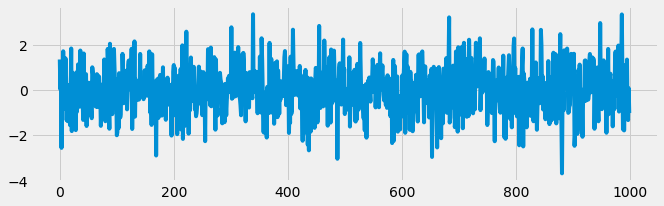

In [0]:
# Plotting white noise
rcParams['figure.figsize'] = 10, 3
white_noise = np.random.normal(loc=0, scale=1, size=1000)
# loc is mean, scale is variance
plt.plot(white_noise)

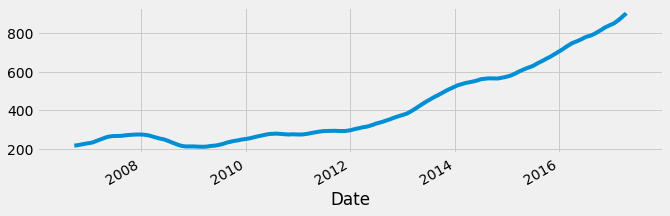

In [0]:
decomposed_google_volume.trend.plot()

In [0]:
# Drop NaN in residual components
sim1=decomposed_google_volume.resid.dropna()

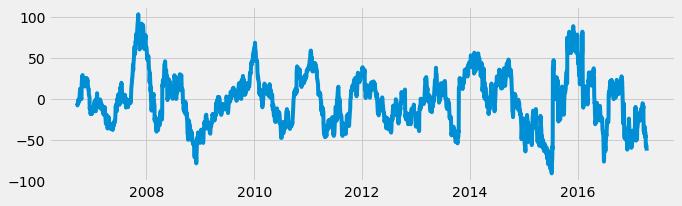

In [0]:
plt.plot(sim1)

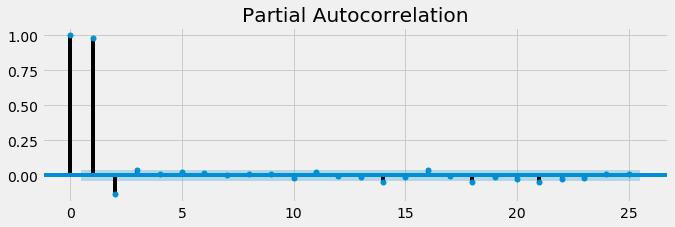

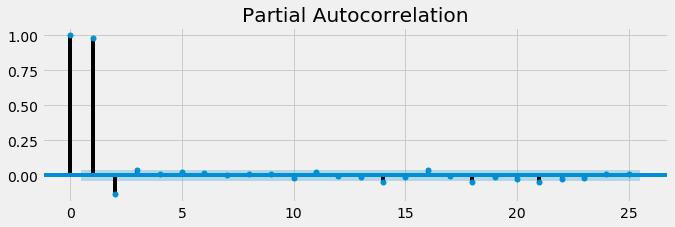

In [0]:
plot_pacf(sim1, lags=25)

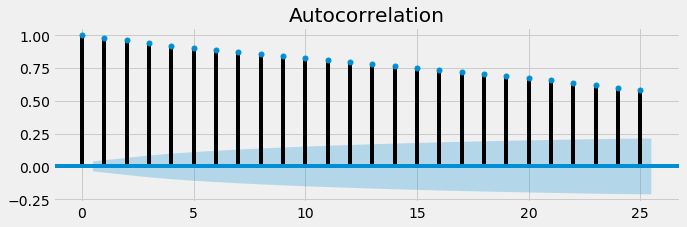

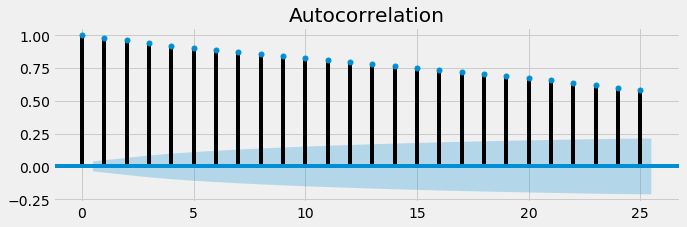

In [0]:
plot_acf(sim1, lags=25) # ACF 25-correlated -> there are some information in residuals

# Part 3: ARMA and ARIMA Model

## Part 3.1: ARMA Model for Residuals of Google High


/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/base/tsa_model.py:219: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



                              ARMA Model Results                              
Dep. Variable:                   High   No. Observations:                 2659
Model:                     ARMA(2, 0)   Log Likelihood               -8394.289
Method:                       css-mle   S.D. of innovations              5.682
Date:                Mon, 04 Nov 2019   AIC                          16796.579
Time:                        01:23:21   BIC                          16820.121
Sample:                             0   HQIC                         16805.099
                                                                              
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -2.8997      5.826     -0.498      0.619     -14.318       8.519
ar.L1.High     1.1192      0.019     58.287      0.000       1.082       1.157
ar.L2.High    -0.1378      0.019     -7.173      0.0

/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/base/tsa_model.py:576: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/base/tsa_model.py:576: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.



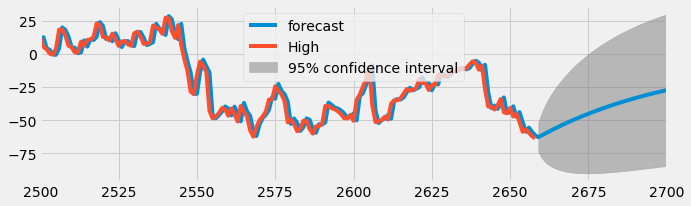

In [0]:
model = ARMA(sim1, order=(2,0))
result = model.fit()
print(result.summary())
print("μ={} ,ϕ={}".format(result.params[0],result.params[1]))
result.plot_predict(start=2500, end=2700)
plt.show()

## Part 3.2: ARIMA Model for Microsoft Volume

In [0]:
print(microsoft["Volume"][0:3]) 
# calculate the difference compared with another value (default is the element in the same column of the previous row)
print(microsoft["Volume"].diff()[0:3])
# remove the first NaN
print(microsoft["Volume"].diff().iloc[1:][0:3])
# get the values
print(microsoft["Volume"].diff().iloc[1:][0:3].values)

Date
2006-01-03    79974418
2006-01-04    57975661
2006-01-05    48247610
Name: Volume, dtype: int64
Date
2006-01-03           NaN
2006-01-04   -21998757.0
2006-01-05    -9728051.0
Name: Volume, dtype: float64
Date
2006-01-04   -21998757.0
2006-01-05    -9728051.0
2006-01-06    52721482.0
Name: Volume, dtype: float64
[-21998757.  -9728051.  52721482.]


                             ARIMA Model Results                              
Dep. Variable:                    D.y   No. Observations:                 3017
Model:                 ARIMA(2, 1, 0)   Log Likelihood              -56385.467
Method:                       css-mle   S.D. of innovations       31647215.011
Date:                Mon, 04 Nov 2019   AIC                         112778.933
Time:                        01:23:33   BIC                         112802.981
Sample:                             1   HQIC                        112787.581
                                                                              
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       9984.0302   2.48e+05      0.040      0.968   -4.75e+05    4.95e+05
ar.L1.D.y     -0.8716      0.016    -53.758      0.000      -0.903      -0.840
ar.L2.D.y     -0.4551      0.016    -28.071      0.0

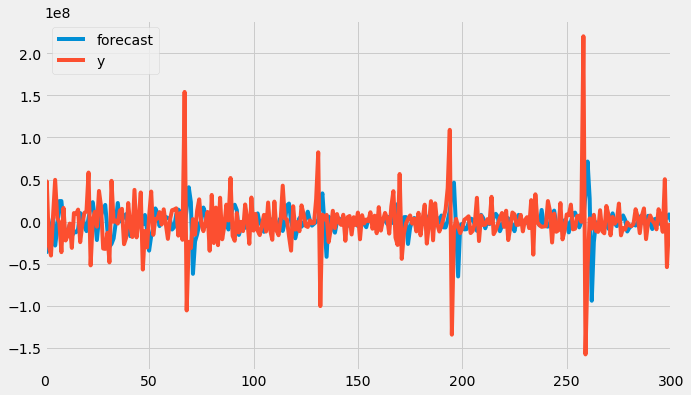

In [0]:
rcParams['figure.figsize'] = 10, 6
model = ARIMA(microsoft["Volume"].diff().iloc[1:].values, order=(2,1,0))
result_microsoft = model.fit()
print(result_microsoft.summary())
result_microsoft.plot_predict(start=700, end=1000)
plt.show()

In [0]:
rmse = math.sqrt(mean_squared_error(microsoft["Volume"].diff().iloc[700:1001].values, result_microsoft.predict(start=700,end=1000)))
print("The root mean squared error is {}.".format(rmse))

The root mean squared error is 61937609.59903903.


## Part 3.3: ARIMA Model for Goggle Volume

In [0]:
# need tune hyperparameters
import itertools   
p = d = q = range(0, 2)
pdq = list(itertools.product(p, d, q))
print(pdq)
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]
print(seasonal_pdq)
print('Examples of parameter combinations for Seasonal ARIMA...')
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[1]))
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[2]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[3]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[4]))


[(0, 0, 0), (0, 0, 1), (0, 1, 0), (0, 1, 1), (1, 0, 0), (1, 0, 1), (1, 1, 0), (1, 1, 1)]
[(0, 0, 0, 12), (0, 0, 1, 12), (0, 1, 0, 12), (0, 1, 1, 12), (1, 0, 0, 12), (1, 0, 1, 12), (1, 1, 0, 12), (1, 1, 1, 12)]
Examples of parameter combinations for Seasonal ARIMA...
SARIMAX: (0, 0, 1) x (0, 0, 1, 12)
SARIMAX: (0, 0, 1) x (0, 1, 0, 12)
SARIMAX: (0, 1, 0) x (0, 1, 1, 12)
SARIMAX: (0, 1, 0) x (1, 0, 0, 12)


In [0]:
for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(google["Volume"],
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)

            results = mod.fit()

            print('ARIMA{}x{}12 - AIC:{}'.format(param, param_seasonal, results.aic))
        except:
            continue

                             ARIMA Model Results                              
Dep. Variable:                    D.y   No. Observations:                 3017
Model:                 ARIMA(2, 1, 0)   Log Likelihood              -48691.203
Method:                       css-mle   S.D. of innovations        2470320.291
Date:                Mon, 04 Nov 2019   AIC                          97390.406
Time:                        01:25:51   BIC                          97414.454
Sample:                             1   HQIC                         97399.054
                                                                              
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       -652.5728   1.93e+04     -0.034      0.973   -3.86e+04    3.73e+04
ar.L1.D.y     -0.8802      0.016    -53.998      0.000      -0.912      -0.848
ar.L2.D.y     -0.4455      0.016    -27.289      0.0

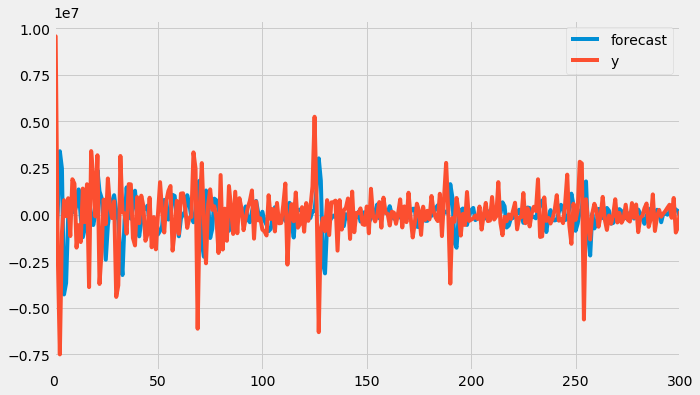

In [0]:
rcParams['figure.figsize'] = 10, 6
model = ARIMA(google["Volume"].diff().iloc[1:].values, order=(2,1,0))
result_google = model.fit()
print(result_google.summary())
result_google.plot_predict(start=700, end=1000)
plt.show()

In [0]:
rmse = math.sqrt(mean_squared_error(google["Volume"].diff().iloc[700:1001].values, result_google.predict(start=700,end=1000)))
print("The root mean squared error is {}.".format(rmse))

The root mean squared error is 3189444.482240708.


# Part 4: LSTM

## Part 4.1: Base Case for Google High

In [0]:
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout, GRU, Bidirectional
from keras.optimizers import SGD

In [0]:
# Some functions to help out with
def plot_predictions(test,predicted):
    plt.plot(test, color='red',label='Real Google Stock Price')
    plt.plot(predicted, color='blue',label='Predicted Google Stock Price')
    plt.title('Google Stock Price Prediction')
    plt.xlabel('Time')
    plt.ylabel('Google Stock Price')
    plt.legend()
    plt.show()

def return_rmse(test,predicted):
    rmse = math.sqrt(mean_squared_error(test, predicted))
    print("The root mean squared error is {}.".format(rmse))

In [0]:
# Checking for missing values
training_set = google[:'2016'].iloc[:,1:2].values
test_set = google['2017':].iloc[:,1:2].values

print(pd.isna(training_set).sum())
print(pd.isna(test_set).sum())
print(len(training_set))
print(len(test_set))

0
0
2768
251


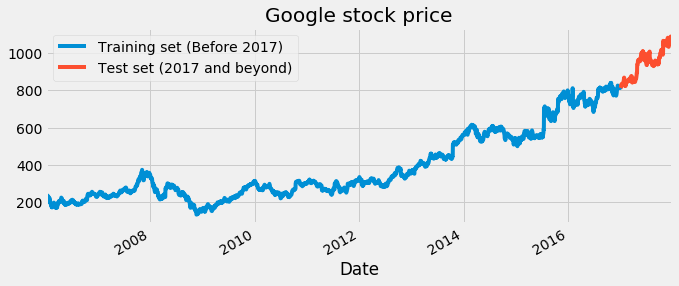

In [0]:
# We have chosen 'High' attribute for prices. Let's see what it looks like
google["High"][:'2016'].plot(figsize=(10,4),legend=True)
google["High"]['2017':].plot(figsize=(10,4),legend=True)
plt.legend(['Training set (Before 2017)','Test set (2017 and beyond)'])
plt.title('Google stock price')
plt.show()

In [0]:
# Scaling the training set
sc = MinMaxScaler(feature_range=(0,1))
training_set_scaled = sc.fit_transform(training_set)
print(training_set_scaled.shape)

(2768, 1)


In [0]:
# Since LSTMs store long term memory state, we create a data structure with 60 timesteps and 1 output
# So for each element of training set, we have 60 previous training set elements 
X_train = []
y_train = []
for i in range(60,2768):
    X_train.append(training_set_scaled[i-60:i,0])
    y_train.append(training_set_scaled[i,0])
X_train, y_train = np.array(X_train), np.array(y_train)
print(X_train.shape)
#print(X_train)

(2708, 60)


In [0]:
# Reshaping X_train for efficient modelling
X_train = np.reshape(X_train, (X_train.shape[0],X_train.shape[1],1))
print(X_train.shape)
#print(X_train)

(2708, 60, 1)


In [0]:
# The LSTM architecture
regressor = Sequential()
# First LSTM layer with Dropout regularisation
regressor.add(LSTM(units=50, return_sequences=True, input_shape=(X_train.shape[1],1)))
regressor.add(Dropout(0.2))
# Second LSTM layer
regressor.add(LSTM(units=50, return_sequences=True))
regressor.add(Dropout(0.2))
# Third LSTM layer
regressor.add(LSTM(units=50, return_sequences=True))
regressor.add(Dropout(0.2))
# Fourth LSTM layer
regressor.add(LSTM(units=50))
regressor.add(Dropout(0.2))
# The output layer
regressor.add(Dense(units=1))

# Compiling the RNN
regressor.compile(optimizer='rmsprop',loss='mean_squared_error')
# Fitting to the training set
regressor.fit(X_train,y_train,epochs=5, batch_size=32)

In [0]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 60 entires of test set have 60 previous values which is impossible to get unless 
# we take the whole 'High' attribute data for processing
google_total = pd.concat((google["High"][:'2016'],google["High"]['2017':]),axis=0)
inputs = google_total[len(google_total)-len(test_set) - 60:].values
print(inputs.shape)
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)
print(inputs.shape)

(311,)
(311, 1)


In [0]:
# Preparing X_test and predicting the prices
X_test = []
for i in range(60,311):
    X_test.append(inputs[i-60:i,0])

X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))
#rint(X_test)
predicted_stock_price = regressor.predict(X_test)
#print(predicted_stock_price)
predicted_stock_price = sc.inverse_transform(predicted_stock_price)
print(predicted_stock_price.shape)
#print(predicted_stock_price)

(251, 1)


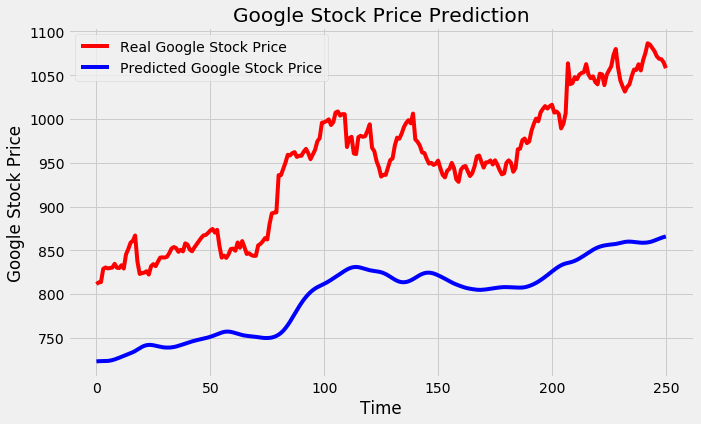

In [0]:
# Visualizing the results for LSTM
plot_predictions(test_set,predicted_stock_price)

In [0]:
predicted_stock_price2 = regressor.predict(X_train)
predicted_stock_price2 = sc.inverse_transform(predicted_stock_price2)

In [0]:
# Evaluating our model
return_rmse(test_set,predicted_stock_price)

The root mean squared error is 152.61424206796494.


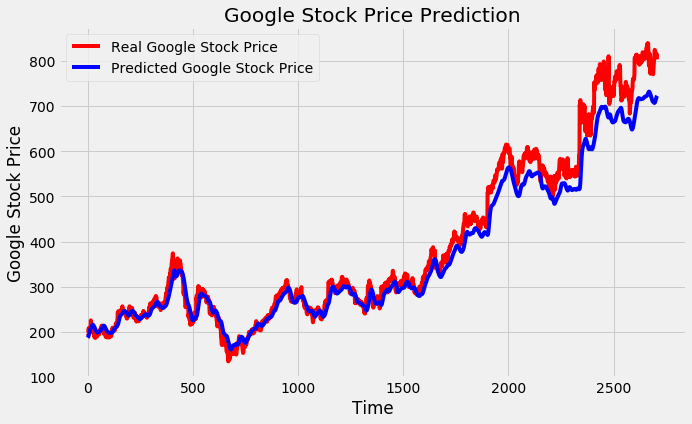

In [0]:
# Visualizing the results for LSTM
plot_predictions(training_set[60:],predicted_stock_price2)

## Part 4.2: Tune Neural Network Hyperparameters

In [0]:
# need rerun x_train and y_train
def create_model():
  # The LSTM architecture
  regressor = Sequential()
  # First LSTM layer with Dropout regularisation
  regressor.add(LSTM(units=50, return_sequences=True, input_shape=(X_train.shape[1],1)))
  regressor.add(Dropout(0.2))
  # Second LSTM layer
  regressor.add(LSTM(units=50, return_sequences=True))
  regressor.add(Dropout(0.2))
  # Third LSTM layer
  regressor.add(LSTM(units=50, return_sequences=True))
  regressor.add(Dropout(0.2))
  # Fourth LSTM layer
  regressor.add(LSTM(units=50))
  regressor.add(Dropout(0.2))
  # The output layer
  regressor.add(Dense(units=1))

  # Compiling the RNN
  regressor.compile(optimizer='rmsprop',loss='mean_squared_error', metrics=['accuracy'])

  return regressor

In [0]:
from keras.wrappers.scikit_learn import KerasClassifier
# create model
model = KerasClassifier(build_fn=create_model) #batch_size=32, epochs=5) 
# use verbose=0 if you do not want to see progress

In [0]:
# Use scikit-learn to grid search 
# grid search epochs, batch size
epochs = [5, 10]
batches = [5, 20, 40]
optimizer = ['rmsprop'] # 'adam']

param_grid = dict(epochs=epochs, batch_size=batches) #, optimizer=optimizer)

In [0]:
# Create grid search
from sklearn.model_selection import GridSearchCV
grid = GridSearchCV(estimator=model, param_grid=param_grid, n_jobs=-1)
print(grid)

GridSearchCV(cv='warn', error_score='raise-deprecating',
             estimator=<keras.wrappers.scikit_learn.KerasClassifier object at 0x7f9a504d9b38>,
             iid='warn', n_jobs=None,
             param_grid={'batch_size': [5, 20, 40], 'epochs': [5, 10]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)


In [0]:
# Fit grid search
grid_result = grid.fit(X_train,y_train)

In [0]:
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.001477 using {'batch_size': 20, 'epochs': 5}
0.000369 (0.000522) with: {'batch_size': 5, 'epochs': 5}
0.000000 (0.000000) with: {'batch_size': 5, 'epochs': 10}
0.001477 (0.002088) with: {'batch_size': 20, 'epochs': 5}
0.000000 (0.000000) with: {'batch_size': 20, 'epochs': 10}
0.000369 (0.000522) with: {'batch_size': 40, 'epochs': 5}
0.000000 (0.000000) with: {'batch_size': 40, 'epochs': 10}


In [0]:
# View hyperparameters of best neural network
grid_result.best_params_

{'batch_size': 20, 'epochs': 5}

## Part 4.3: Apply Tuned Parameters

In [65]:
# The LSTM architecture
regressor_tune = Sequential()
# First LSTM layer with Dropout regularisation
regressor_tune.add(LSTM(units=50, return_sequences=True, input_shape=(X_train.shape[1],1)))
regressor_tune.add(Dropout(0.2))
# Second LSTM layer
regressor_tune.add(LSTM(units=50, return_sequences=True))
regressor_tune.add(Dropout(0.2))
# Third LSTM layer
regressor_tune.add(LSTM(units=50, return_sequences=True))
regressor_tune.add(Dropout(0.2))
# Fourth LSTM layer
regressor_tune.add(LSTM(units=50))
regressor_tune.add(Dropout(0.2))
# The output layer
regressor_tune.add(Dense(units=1))

# Compiling the RNN
regressor_tune.compile(optimizer='rmsprop',loss='mean_squared_error')
# Fitting to the training set
regressor_tune.fit(X_train,y_train,epochs=5, batch_size=20)

Epoch 1/5
2708/2708 [==============================] - 44s 16ms/step - loss: 0.0113
Epoch 2/5
2708/2708 [==============================] - 25s 9ms/step - loss: 0.0054
Epoch 3/5
2708/2708 [==============================] - 25s 9ms/step - loss: 0.0040
Epoch 4/5
2708/2708 [==============================] - 25s 9ms/step - loss: 0.0036
Epoch 5/5
2708/2708 [==============================] - 26s 9ms/step - loss: 0.0030


In [66]:
predicted_stock_price_tuned = regressor_tune.predict(X_test)
#print(predicted_stock_price)
predicted_stock_price_tuned = sc.inverse_transform(predicted_stock_price_tuned)
print(predicted_stock_price_tuned.shape)

(251, 1)


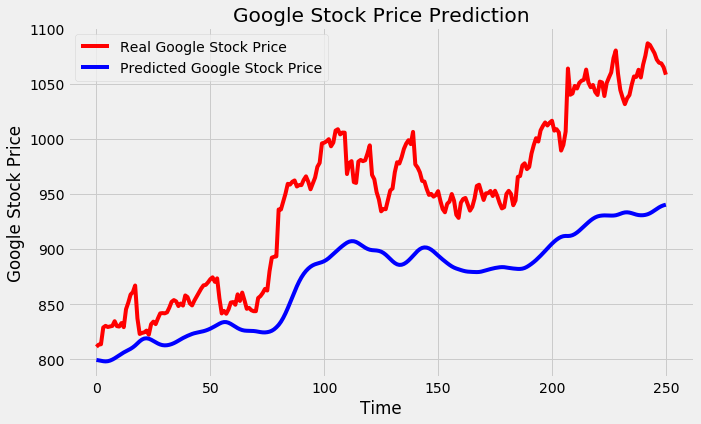

In [69]:
# Visualizing the results for LSTM
plot_predictions(test_set,predicted_stock_price_tuned)

In [0]:
predicted_stock_price2_tuned = regressor_tune.predict(X_train)
predicted_stock_price2_tuned = sc.inverse_transform(predicted_stock_price2_tuned)

In [74]:
# Evaluating our model
return_rmse(test_set,predicted_stock_price_tuned)

The root mean squared error is 81.58064918193207.


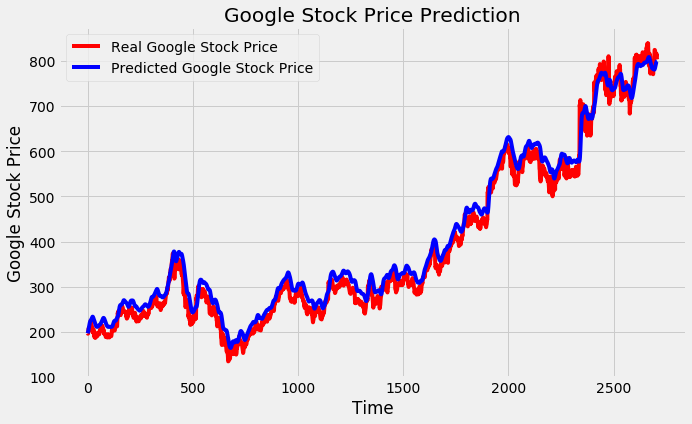

In [75]:
# Visualizing the results for LSTM
plot_predictions(training_set[60:],predicted_stock_price2_tuned)